In [25]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi']= 300

In [7]:
df=pd.read_csv("averages_enrol.csv")
df[["term"]]=pd.Categorical(df.term)
df.head()

,term,ccode,section,instructor,org,expl_lvl,q_treat,visual,oral,help,...,attend,assign,notes,textbook,new_mat,assign_amt,outside,num_resp,enrolled,resp_rate
0,1131,['ACTSC 231'],1,Anne Mackay,1.600000,2.873239,1.536232,1.591549,1.676056,1.526316,...,1.225352,1.588235,1.358209,2.036364,2.782609,2.901639,2.279412,71,184,0.385870
1,1131,['ACTSC 231'],51,Carole Bernard,1.727273,2.909091,2.090909,1.700000,2.000000,1.444444,...,1.000000,1.300000,1.625000,1.333333,2.545455,2.818182,2.000000,11,18,0.611111
2,1131,['ACTSC 232'],1,James Adcock,1.360825,2.804124,1.453608,1.567010,1.268041,2.000000,...,1.154639,1.604167,1.516129,1.865169,2.659794,2.927835,2.000000,97,143,0.678322
3,1131,['ACTSC 331'],1,Rocky Cui,1.851064,2.744681,2.043478,1.978723,2.108696,1.515152,...,1.297872,1.500000,1.586207,1.878049,2.659574,2.755556,2.021277,47,95,0.494737
4,1131,['ACTSC 371'],1,Brent Matheson,2.221053,2.821053,2.000000,2.452632,2.242105,2.565217,...,1.329787,1.741935,1.909091,2.271429,2.851064,3.021277,1.903226,95,236,0.402542


In [8]:
df1=df[df.num_resp>10] # only surveys with >10 responses
df1=df1.groupby("instructor").filter(lambda x:len(x)>2) # only teachers with >=3 classes
df1.head()

,term,ccode,section,instructor,org,expl_lvl,q_treat,visual,oral,help,...,attend,assign,notes,textbook,new_mat,assign_amt,outside,num_resp,enrolled,resp_rate
2,1131,['ACTSC 232'],1,James Adcock,1.360825,2.804124,1.453608,1.567010,1.268041,2.000000,...,1.154639,1.604167,1.516129,1.865169,2.659794,2.927835,2.000000,97,143,0.678322
4,1131,['ACTSC 371'],1,Brent Matheson,2.221053,2.821053,2.000000,2.452632,2.242105,2.565217,...,1.329787,1.741935,1.909091,2.271429,2.851064,3.021277,1.903226,95,236,0.402542
6,1131,['ACTSC 372'],1,Peter Wood,1.435644,2.623762,1.400000,1.574257,1.386139,1.712121,...,1.227723,1.666667,1.785714,2.103896,2.762376,2.891089,1.930000,101,174,0.580460
7,1131,"['ACTSC 433', 'ACTSC 833']",1,Jun Cai,1.723077,2.859375,2.262295,1.923077,2.476923,2.352941,...,1.138462,1.415385,1.578947,2.166667,2.907692,2.707692,1.968750,65,107,0.607477
8,1131,"['ACTSC 446', 'ACTSC 846']",1,Ruodo Wang,2.308411,2.557692,1.990566,2.644860,2.679245,2.000000,...,1.457944,1.775701,1.819444,2.370968,2.538462,2.844660,2.038095,107,178,0.601124


<ipython-input-9-4608955f3465>:1: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  df1.hist(ax=plt.figure(figsize = (15,20)).gca());


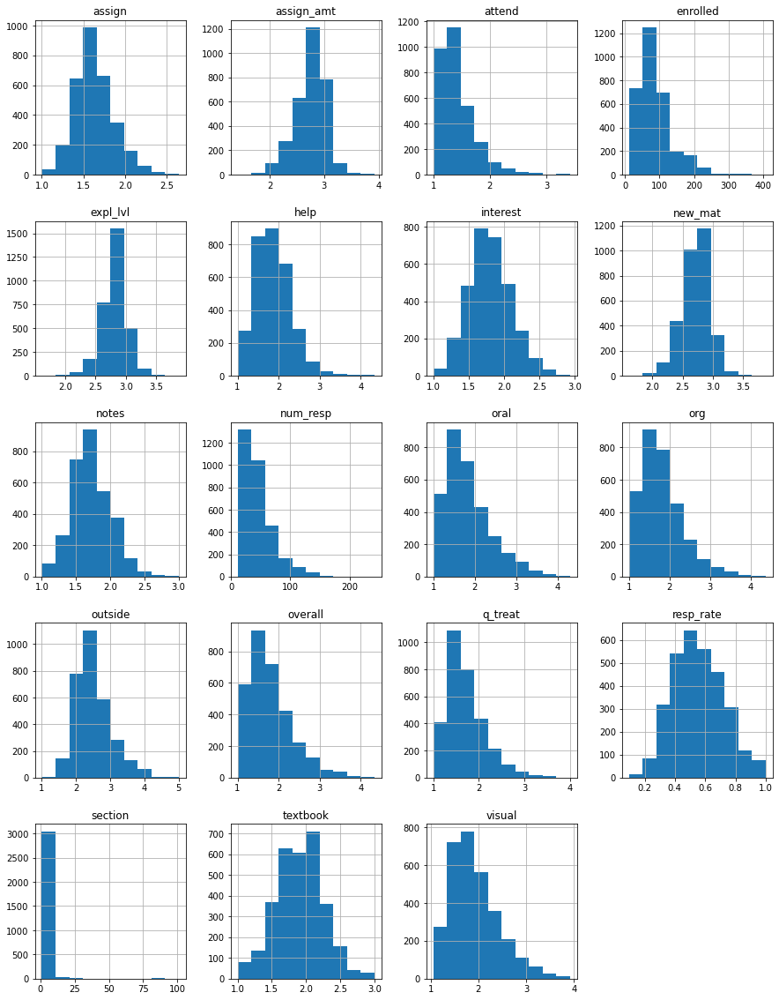

In [9]:
df1.hist(ax=plt.figure(figsize = (15,20)).gca());

In [10]:
df1.columns

Index(['term', 'ccode', 'section', 'instructor', 'org', 'expl_lvl', 'q_treat',
       'visual', 'oral', 'help', 'interest', 'overall', 'attend', 'assign',
       'notes', 'textbook', 'new_mat', 'assign_amt', 'outside', 'num_resp',
       'enrolled', 'resp_rate'],
      dtype='object')

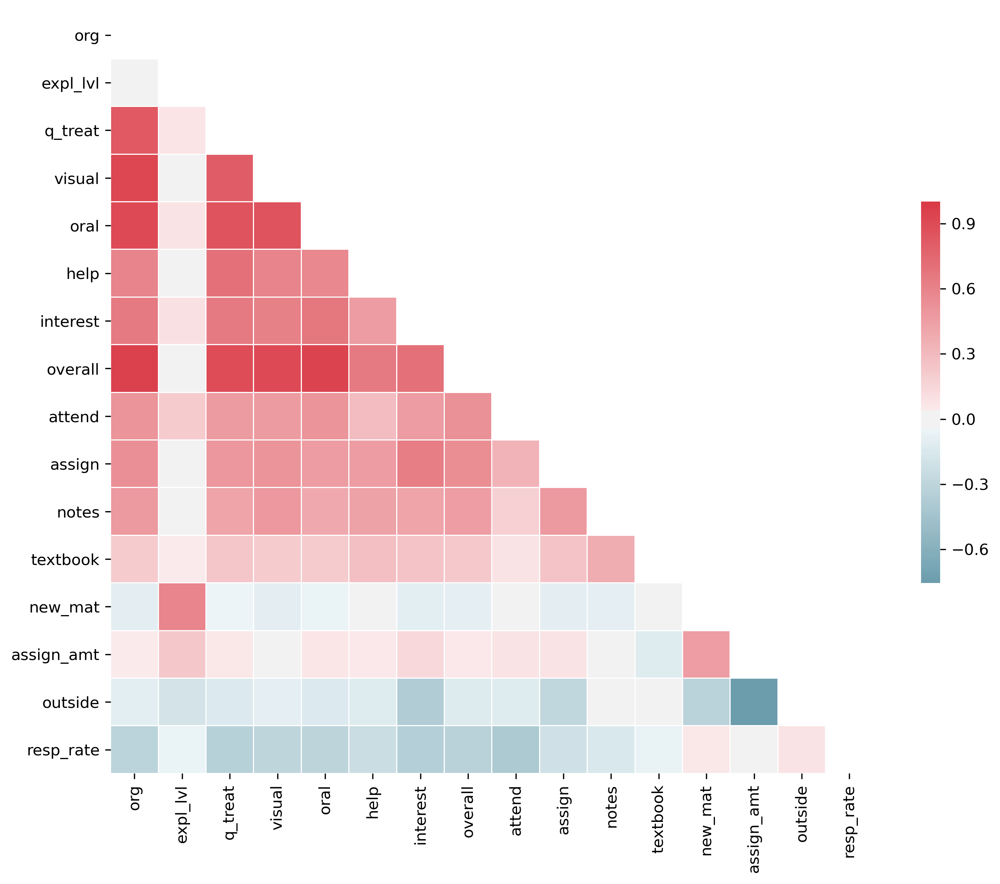

In [26]:
df1cor=df1.drop(["term","section","num_resp","enrolled",],1).corr()

mask = np.zeros_like(df1cor, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(df1cor,mask=mask,square=True,cmap=cmap,linewidths=.5,center=0,cbar_kws={"shrink": .5})

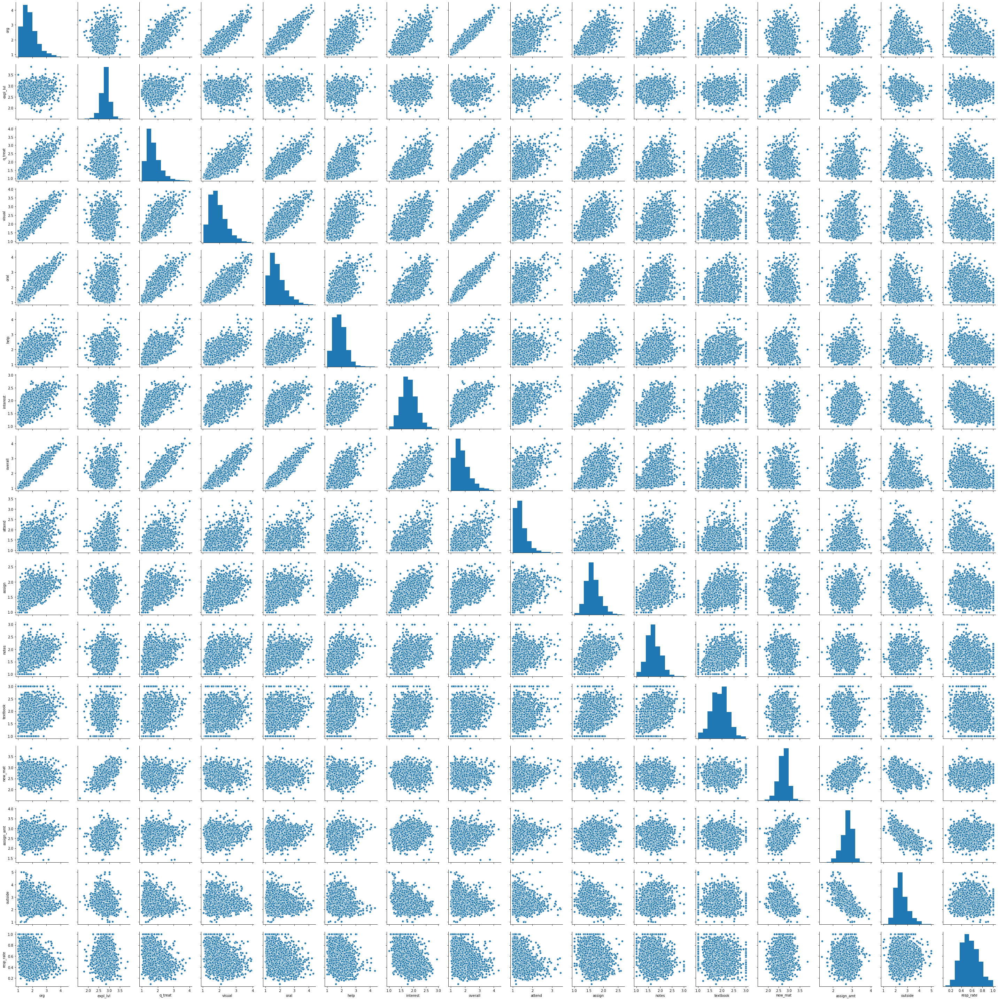

In [11]:
sns.pairplot(df1.drop(["term","section","num_resp","enrolled",],1)); # lol unreadable

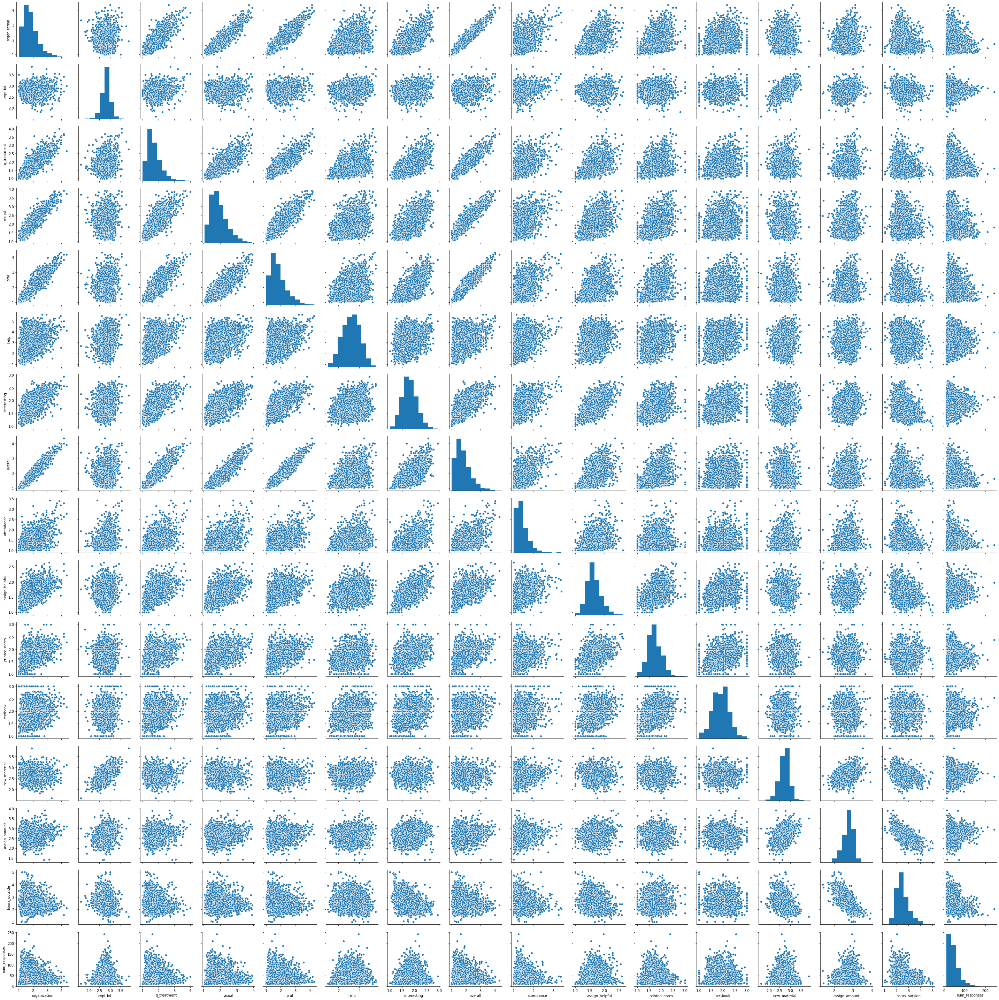

In [312]:
sns.pairplot(df1.drop(["term","section","num_resp","enrolled",],1)); # lol unreadable

In [305]:
df1["dept"]=df1.ccode.apply(lambda x:x.split(" ",1)[0])

In [306]:
df1.dept.value_counts()

CS        1247
MATH       696
STAT       436
ACTSC      200
AMATH      169
CO         158
PMATH       91
COMM        42
CM          27
MATBUS      24
MTHEL       14
SE          13
ACC          3
Name: dept, dtype: int64

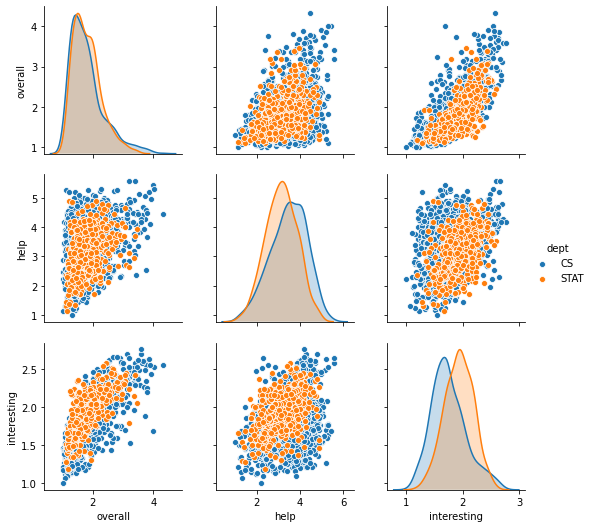

In [307]:
depts=["CS","STAT"]#,"ACTSC","MATH","AMATH","CO","PMATH"]
sns.pairplot(df1[df1.dept.isin(depts)],
             vars=["overall","help","interesting"],hue="dept");

In [28]:
sal=pd.concat([pd.read_csv(f"salaries/p_{yr}.csv") for yr in range(2018,2010,-1)])
sal=sal.groupby("name").first()
sal.head(50)

,title,salary,benefits
name,,,
A. Tupling,Professor,180567.92,519.72
A.Russell Tupling,Professor,166933.16,578.96
Abigail Scholer,Associate Professor,132597.73,373.00
Achim Kempf,Professor,187834.44,395.88
Ada Barlatt,Assistant Professor,102159.48,359.08
Ada Hurst,Lecturer,128921.00,380.48
Adam Kolkiewicz,Associate Professor,175958.20,519.36
Adam Neale,Lecturer,102058.60,169.28
Adam Tsen,Assistant Professor,128595.20,147.44


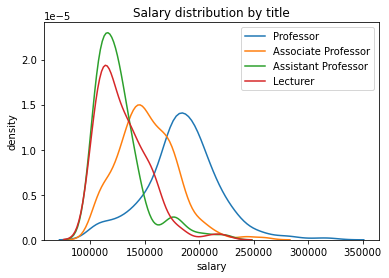

In [332]:
for tit in sal.title.unique():
    sns.kdeplot(sal[sal.title==tit].salary,label=tit)
plt.legend();

plt.xlabel('salary')
plt.ylabel('density')
plt.title('Salary distribution by title');
# plt.savefig("sal_dist.png")

In [29]:
sal.loc["David Jao"]

title       Professor
salary         141649
benefits       447.56
Name: David Jao, dtype: object

In [30]:
sal.sort_values("salary",ascending=False).head(10)

,title,salary,benefits
name,,,
Raymond Laflamme,Professor,322455.36,780.76
Thomas Scott,Professor,316407.53,627.64
Ken Tan,Professor,310591.52,234.76
David Cory,Professor,298323.32,314.20
George Dixon,Professor,285000.06,3600.00
Kenneth Klassen,Professor,283675.32,611.56
Alan Webb,Professor,282151.52,596.68
Sushanta Mitra,Professor,279093.18,514.64
David Edwards,Professor,274601.76,332.16


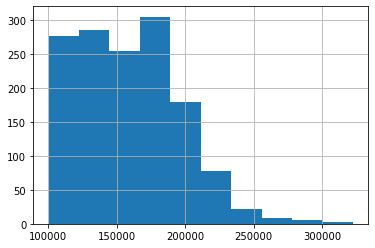

In [298]:
sal.salary.hist();

In [289]:
sal.title.value_counts()

Professor              589
Associate Professor    464
Assistant Professor    195
Lecturer               171
Name: title, dtype: int64

In [302]:
df11=df1.groupby("instructor")[["overall"]].mean().sort_values(ascending=True,by="overall").reset_index()

salj=pd.merge(df11,sal,how='left', left_on=["instructor"],right_on=['name'])
salj[salj.isna().any(axis=1)]#[0:50]

,instructor,overall,title,salary,benefits
1,Ryan Trelford,1.142239,NaN,NaN,NaN
9,Jordan Hamilton,1.211254,NaN,NaN,NaN
24,Blake Madill,1.297009,NaN,NaN,NaN
26,Xi Gao,1.300078,NaN,NaN,NaN
33,Michelle Ashburner,1.322350,NaN,NaN,NaN
...,...,...,...,...,...
344,Maite Dupuis,3.017096,NaN,NaN,NaN
345,Ahmad Alrefai,3.225774,NaN,NaN,NaN
347,Daniela Maftuleac,3.326026,NaN,NaN,NaN
348,Steven Gindi,3.395768,NaN,NaN,NaN
